In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import accuracy_score

In [2]:
pd.set_option("display.max_rows", 100)

df = pd.read_csv('./dataset/rookie_df.csv', header=0)
print(f"Nan: {df.isnull().values.any()}")

Nan: False


In [3]:
print(df.duplicated(subset=df.loc[:, df.columns != 'target'].columns.tolist()).sum())
print(df.duplicated().sum())

0
0


In [4]:
df.drop(columns=['Unnamed: 0', 'Year Drafted'], inplace=True)

In [31]:
display(df)

,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,...,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,EFF,target
0,70,34.5,16.7,6.1,15.1,40.5,0.8,3.0,26.4,3.7,...,70.3,1.4,4.8,6.2,6.3,1.9,0.6,3.5,17.6,1
1,70,32.3,12.8,4.9,12.8,38.0,1.6,4.8,33.0,1.5,...,90.3,0.5,2.4,3.0,5.7,0.6,0.1,1.9,12.1,1
2,80,31.1,13.8,4.9,11.7,41.9,0.9,2.8,32.7,3.1,...,78.0,0.5,3.6,4.1,4.1,1.6,0.5,3.2,13.2,1
3,82,26.7,8.8,3.1,8.3,37.6,1.2,3.6,32.0,1.4,...,80.4,0.6,2.2,2.9,1.0,0.6,0.2,1.2,6.7,1
4,77,24.6,6.8,2.2,5.4,41.4,0.5,1.5,34.7,1.8,...,68.3,1.0,3.4,4.4,1.9,0.8,0.8,1.6,9.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1419,59,10.1,3.2,1.4,3.1,45.4,0.0,0.1,0.0,0.4,...,56.4,0.5,0.6,1.0,1.2,0.6,0.1,1.3,2.8,0
1420,47,9.6,2.0,0.7,2.0,35.8,0.0,0.1,0.0,0.5,...,78.1,0.2,0.7,0.9,1.5,0.5,0.0,0.6,2.9,1
1421,60,8.9,2.8,1.0,3.0,33.0,0.0,0.1,0.0,0.9,...,73.9,0.5,0.7,1.2,1.3,0.4,0.0,0.6,2.7,0
1422,55,8.4,2.7,1.0,2.5,41.2,0.0,0.1,0.0,0.7,...,43.5,0.5,1.2,1.7,0.3,0.4,0.4,0.6,2.6,0


In [6]:
df.describe()

,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,...,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,EFF,target
count,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,...,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000,1424.000000
mean,61.131320,17.483216,6.735323,2.602247,5.799930,44.353301,0.238062,0.740520,18.805126,1.295084,...,70.270857,1.034059,2.041011,3.075211,1.497331,0.601826,0.388764,1.188062,7.381461,0.601124
std,16.828774,8.265126,4.324453,1.666493,3.545943,6.073722,0.385139,1.057448,16.736753,0.981904,...,10.641220,0.786525,1.371742,2.081747,1.445766,0.406427,0.471463,0.714481,4.621797,0.489839
min,11.000000,3.100000,0.700000,0.300000,0.800000,20.500000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.100000,0.200000,0.000000,0.000000,0.000000,0.100000,0.200000,0.000000
25%,48.000000,10.900000,3.600000,1.400000,3.200000,40.500000,0.000000,0.000000,0.000000,0.600000,...,64.500000,0.500000,1.000000,1.575000,0.500000,0.300000,0.100000,0.700000,3.800000,0.000000
50%,64.000000,15.950000,5.500000,2.100000,4.800000,44.300000,0.000000,0.200000,21.400000,1.000000,...,71.200000,0.800000,1.700000,2.600000,1.000000,0.500000,0.200000,1.000000,6.350000,1.000000
75%,77.000000,23.000000,8.800000,3.400000,7.500000,48.100000,0.300000,1.100000,32.700000,1.700000,...,77.500000,1.400000,2.700000,4.000000,1.900000,0.800000,0.500000,1.500000,9.800000,1.000000
max,82.000000,40.900000,28.200000,10.200000,19.800000,73.700000,2.300000,6.500000,100.000000,7.700000,...,100.000000,5.400000,9.600000,13.900000,10.600000,2.500000,5.000000,4.400000,30.600000,1.000000


## plots

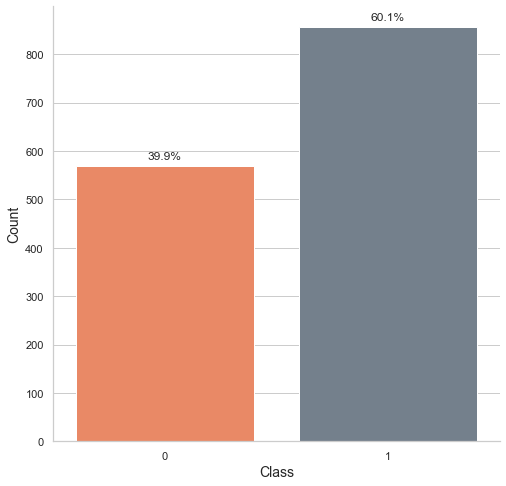

In [7]:
sns.set(style="whitegrid")

plt.figure(figsize=(8,8))
ax = sns.countplot(x='target', data=df, palette=['coral','slategray'])
plt.ylabel('Count', fontsize=14)
plt.xlabel('Class', fontsize=14)
sns.despine()
tot = 0
for p in ax.patches:
    tot += p.get_height()
for p in ax.patches:
    ax.annotate(f'{p.get_height()/tot:.1%}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

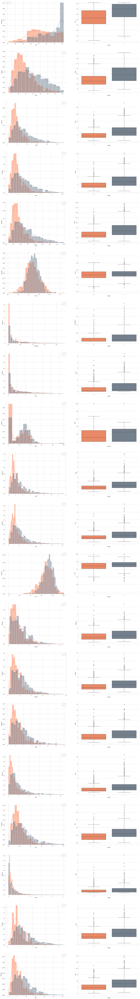

In [8]:
plt.subplots(figsize=(25, 210))
for i, v in enumerate(df.columns):
    if v=='target':
        continue
    plt.subplot(22,2,i*2+1)
    sns.histplot(x=v, data=df[df['target']==0], fill=True, color='coral', kde=True, stat='density')
    sns.histplot(x=v, data=df[df['target']==1], fill=True, color='slategray', kde=True, stat='density')
    plt.legend(labels=[0,1])
    #sns.kdeplot(x=v, data=df[df['target']==1], fill=True, color='coral')
    #sns.kdeplot(x=v, data=df[df['target']==0], fill=True, color='slategray')
    plt.subplot(22,2,i*2+2)
    sns.boxplot(y=v, x='target', data=df, palette=['coral', 'slategray'])
    sns.despine()

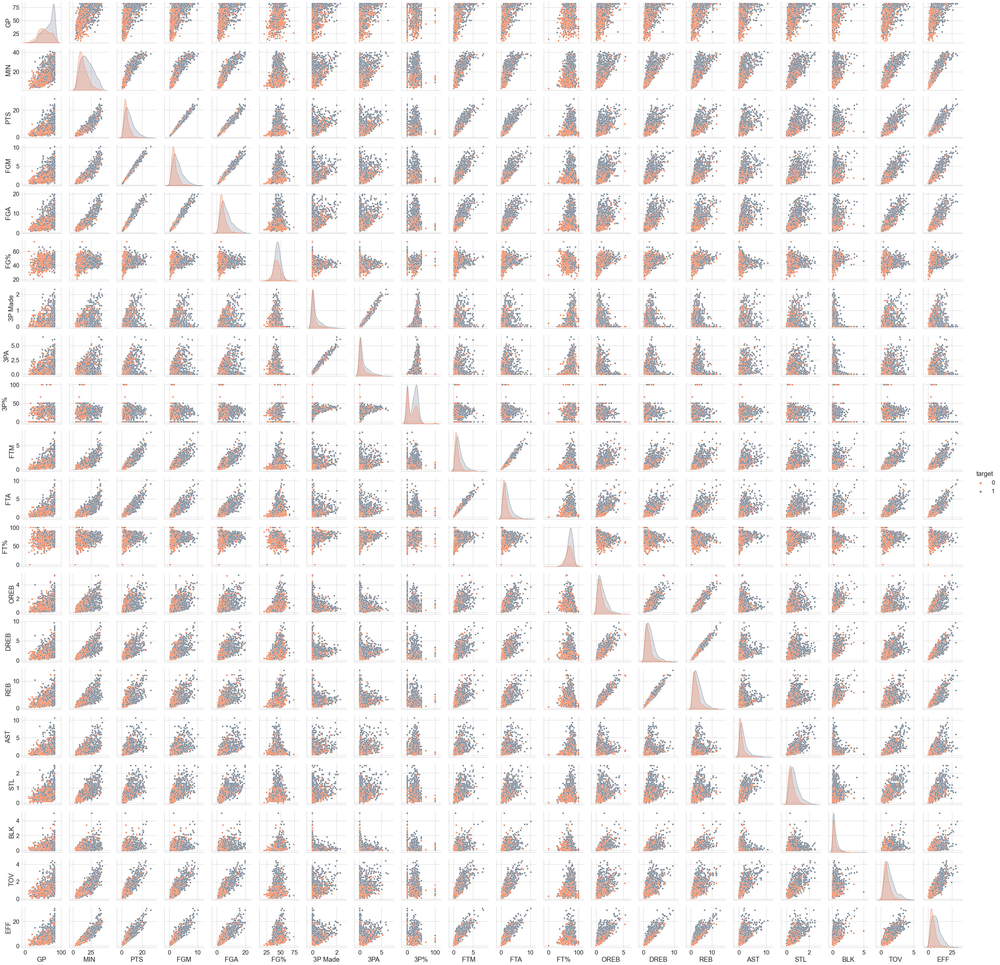

In [9]:
#plt.figure(figsize=(20,20))
sns.set(font_scale = 2, style="whitegrid")
sns.pairplot(df, hue='target', palette=['coral', 'slategray'])
plt.show()
sns.set(style="whitegrid")

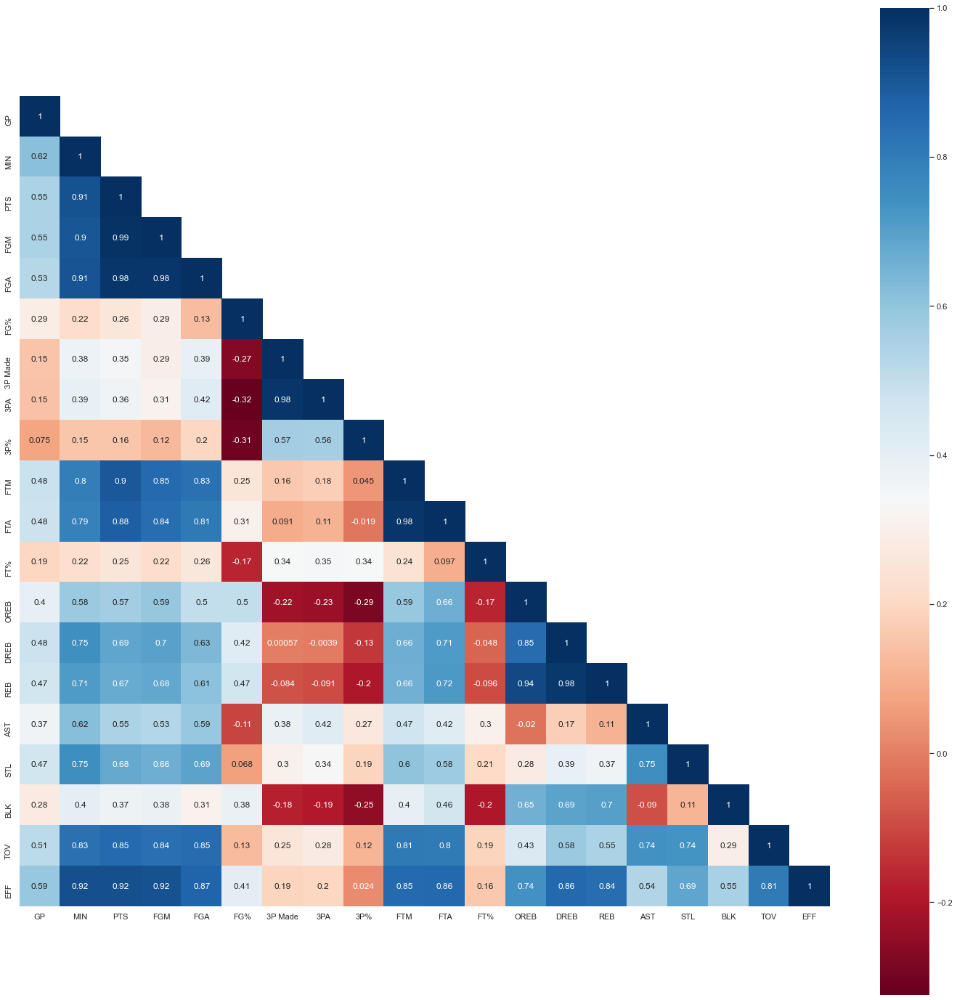

In [10]:
features = df.drop(columns='target')
corr = features.corr()
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)

plt.figure(figsize=(25,25))
sns.heatmap(corr, annot=True, square=True, cmap='RdBu', mask=mask)
plt.show()

## normalize features

In [11]:
x = df.drop(columns='target').values
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
df_stand = pd.DataFrame(x_scaled)
targets = pd.DataFrame(df.target.values)

df_stand = df_stand.merge(targets, left_index=True, right_index=True)

df_stand.columns = df.columns

## Prepare Dataset

In [12]:
y = df_stand['target'].copy()
print(y.shape)

(1424,)


In [13]:
X = df_stand.drop(columns=['target'], axis=1)
print(X.shape)

(1424, 20)


## Split Data (80%-20%)

In [14]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)
print(X_train_val.shape)
print(X_test.shape)

(1139, 20)
(285, 20)


In [15]:
X_train_val = X_train_val.to_numpy()
y_train_val = y_train_val.to_numpy()
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

# DIMENSIONALITY REDUCTION

## PCA analysis

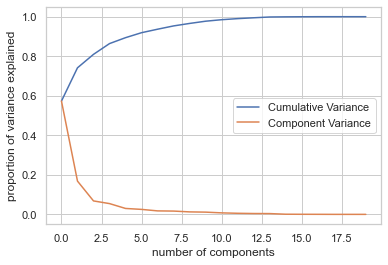

In [20]:
pca = PCA().fit(X_train_val)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('proportion of variance explained');
plt.legend(['Cumulative Variance', 'Component Variance'])
plt.show()

In [21]:
pca = PCA(n_components = 0.85)
X_train_val = pca.fit_transform(X_train_val)
X_test = pca.transform(X_test)

In [22]:
X_train_val.shape

(1139, 4)

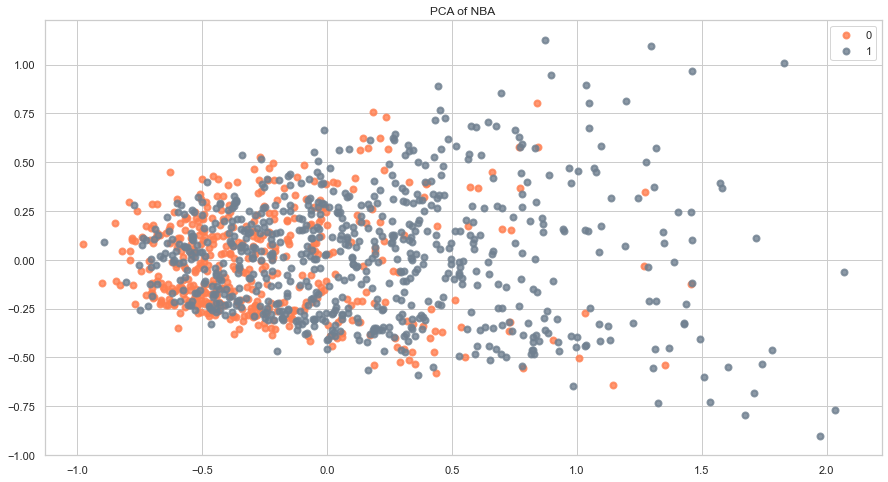

In [23]:
plt.figure(figsize=(15,8))
colors = ['coral', 'slategray']
target_names=['0', '1']
lw = 2

for color, i, target_name in zip(colors, [0, 1], target_names):
    plt.scatter(X_train_val[y_train_val == i, 0], X_train_val[y_train_val == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of NBA')
plt.show()

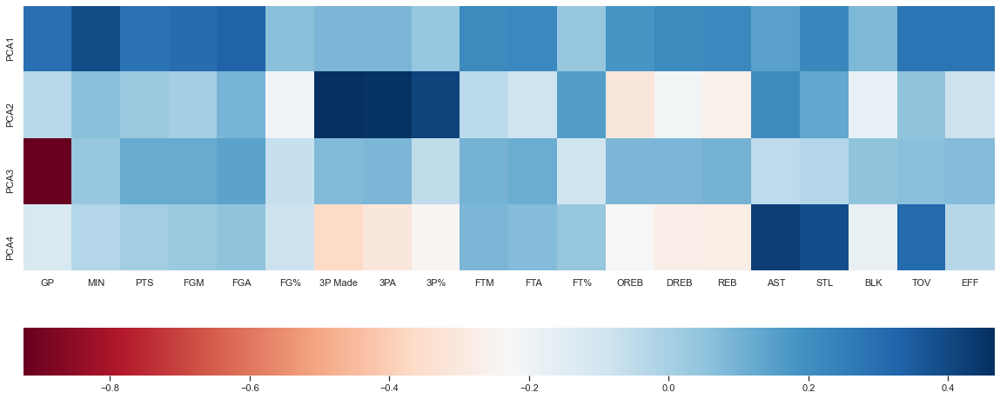

In [24]:
plt.figure(figsize=(20, 8))
sns.heatmap(pca.components_,
                 cmap='RdBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pca.n_components_+1)],
                 xticklabels=list(df_stand.drop(columns=['target']).columns),
                 cbar_kws={"orientation": "horizontal"})
ax.set_aspect("equal")
plt.show()

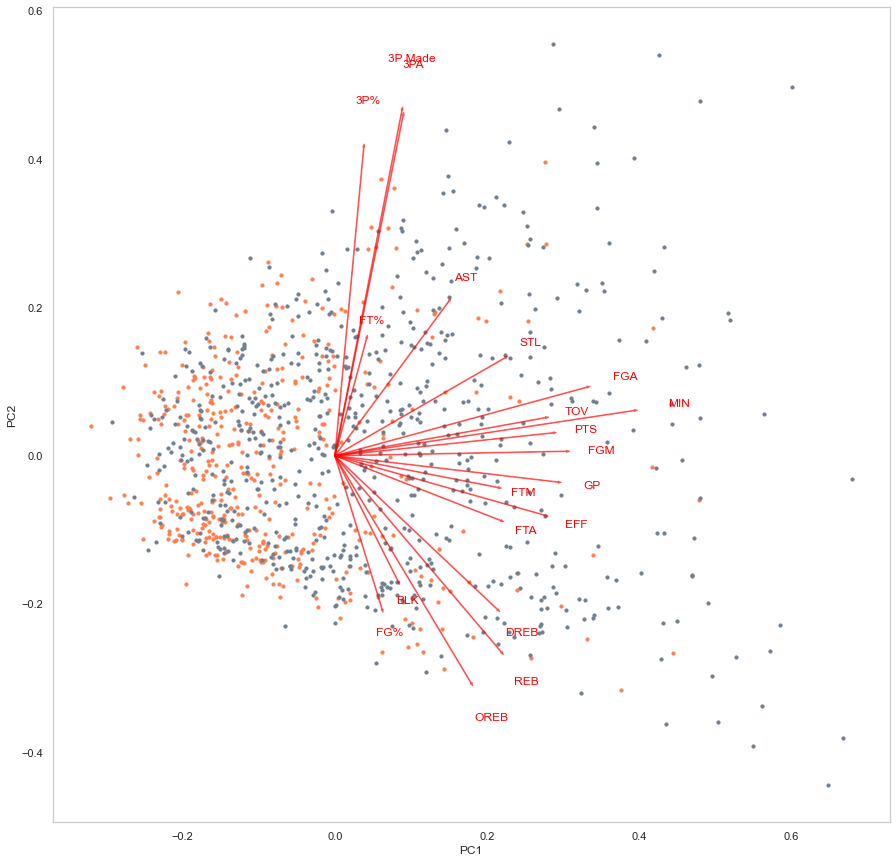

In [25]:
def myplot(score,y_train,coeff,labels=None):
    cdict = {0: 'coral', 1: 'slategray'}
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    for g in np.unique(y_train):
        ix = np.where(y_train == g)
        plt.scatter(xs[ix] * scalex, ys[ix] * scaley, s=10, c=cdict[int(g)], label=g)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1], color = 'red', alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'red', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'red', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

plt.figure(figsize=(15, 15))
myplot(X_train_val[:,0:2], y_train_val, np.transpose(pca.components_[0:2, :]),list(df_stand.drop(columns=['target']).columns))
plt.show()

# MODELS

In [26]:
X_train_val.shape, X_test.shape

((1139, 4), (285, 4))

## Decision Tree

{'criterion': 'gini', 'max_depth': None, 'max_features': None}: mean accuracy score 0.577
{'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt'}: mean accuracy score 0.615
{'criterion': 'gini', 'max_depth': 5, 'max_features': None}: mean accuracy score 0.644
{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt'}: mean accuracy score 0.657
{'criterion': 'gini', 'max_depth': 10, 'max_features': None}: mean accuracy score 0.582
{'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt'}: mean accuracy score 0.620
{'criterion': 'gini', 'max_depth': 15, 'max_features': None}: mean accuracy score 0.572
{'criterion': 'gini', 'max_depth': 15, 'max_features': 'sqrt'}: mean accuracy score 0.606
{'criterion': 'entropy', 'max_depth': None, 'max_features': None}: mean accuracy score 0.587
{'criterion': 'entropy', 'max_depth': None, 'max_features': 'sqrt'}: mean accuracy score 0.612
{'criterion': 'entropy', 'max_depth': 5, 'max_features': None}: mean accuracy score 0.640
{'criter

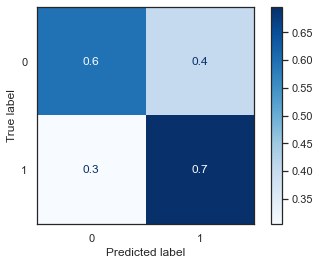

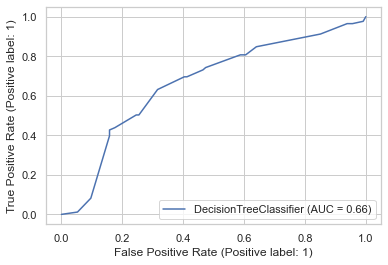

              precision    recall  f1-score   support

           0       0.57      0.60      0.58       114
           1       0.72      0.70      0.71       171

    accuracy                           0.66       285
   macro avg       0.64      0.65      0.64       285
weighted avg       0.66      0.66      0.66       285



In [27]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = []

parameters = {
  "criterion": ["gini", "entropy"],
  "max_depth": [None, 5, 10, 15],
  "max_features": [None, "sqrt"]
  }

best_config = None
best_score = 0

sm = SMOTE(random_state=42)

for config in ParameterGrid(parameters):
    scores = []
    for train_index, test_index in kf.split(X_train_val, y_train_val):
        X_train, X_val = X_train_val[train_index], X_train_val[test_index]
        y_train, y_val = y_train_val[train_index], y_train_val[test_index]
    
        #SMOTE
        X_res, y_res = sm.fit_resample(X_train, y_train)
        #X_res, y_res = X_train, y_train
    
        #Classification
        clf = DecisionTreeClassifier(**config, random_state=42)
        clf.fit(X_res, y_res)
        pred = clf.predict(X_val)
        scores.append(accuracy_score(y_val, pred))
    
    if np.mean(scores)>best_score:
        best_score = np.mean(scores)
        best_config = config
    print(f"{config}: mean accuracy score {np.mean(scores):.3f}")

X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
#X_res, y_res = X_train_val, y_train_val
clf = DecisionTreeClassifier(**best_config, random_state=42)
clf.fit(X_res, y_res)
pred = clf.predict(X_test)
print(f"\nbest config: {best_config}\n")
print(f"accuracy score: {accuracy_score(y_test, pred):.3f}")
sns.set(style="white")
plot_confusion_matrix(clf, X_test, y_test, normalize='true', cmap='Blues')
sns.set(style="whitegrid")
plot_roc_curve(clf, X_test, y_test)
plt.show()
print(classification_report(y_test, pred))

In [ ]:
importance = clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print(f'Feature: {df.columns[i]}, Score: {v:.5f}')
# plot feature importance
plt.figure(figsize=(13,4))
plt.bar([df.columns[x] for x in range(len(importance))], importance, color='slategray')
plt.show()

## Random Forest

{'criterion': 'gini', 'max_depth': None, 'max_features': None, 'n_estimators': 50}: mean accuracy score 0.643
{'criterion': 'gini', 'max_depth': None, 'max_features': None, 'n_estimators': 100}: mean accuracy score 0.648
{'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 50}: mean accuracy score 0.657
{'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 100}: mean accuracy score 0.662
{'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'n_estimators': 50}: mean accuracy score 0.673
{'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'n_estimators': 100}: mean accuracy score 0.664
{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 50}: mean accuracy score 0.678
{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 100}: mean accuracy score 0.672
{'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'n_estimators': 50}: mean accuracy score 0.654
{'criterion'

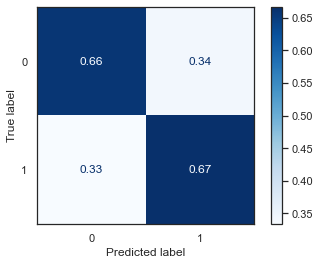

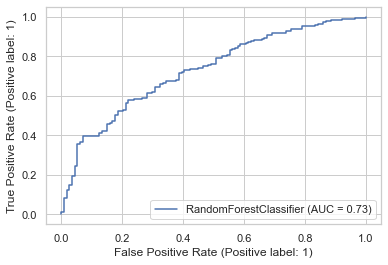

              precision    recall  f1-score   support

           0       0.57      0.66      0.61       114
           1       0.75      0.67      0.70       171

    accuracy                           0.66       285
   macro avg       0.66      0.66      0.66       285
weighted avg       0.67      0.66      0.67       285



In [28]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = []

parameters = {
  "criterion": ["gini", "entropy"],
  "n_estimators": [50, 100],
  "max_depth": [None, 5, 10, 15],
  "max_features": [None, "sqrt"]
  }

best_config = None
best_score = 0

sm = SMOTE(random_state=42)

for config in ParameterGrid(parameters):
    scores = []
    for train_index, test_index in kf.split(X_train_val, y_train_val):
        X_train, X_val = X_train_val[train_index], X_train_val[test_index]
        y_train, y_val = y_train_val[train_index], y_train_val[test_index]
    
        #SMOTE
        X_res, y_res = sm.fit_resample(X_train, y_train)
        #X_res, y_res = X_train, y_train
    
        #Classification
        clf = RandomForestClassifier(**config, random_state=42)
        clf.fit(X_res, y_res)
        pred = clf.predict(X_val)
        scores.append(accuracy_score(y_val, pred))
    
    if np.mean(scores)>best_score:
        best_score = np.mean(scores)
        best_config = config
    print(f"{config}: mean accuracy score {np.mean(scores):.3f}")

X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
#X_res, y_res = X_train_val, y_train_val
clf = RandomForestClassifier(**best_config, random_state=42)
clf.fit(X_res, y_res)
pred = clf.predict(X_test)
print(f"\nbest config: {best_config}\naccuracy score: {accuracy_score(y_test, pred):.3f}")
sns.set(style="white")
plot_confusion_matrix(clf, X_test, y_test, normalize='true', cmap='Blues')
sns.set(style="whitegrid")
plot_roc_curve(clf, X_test, y_test)
plt.show()
print(classification_report(y_test, pred))

In [ ]:
importance = clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print(f'Feature: {df.columns[i]}, Score: {v:.5f}')
# plot feature importance
plt.figure(figsize=(13,4))
plt.bar([df.columns[x] for x in range(len(importance))], importance, color='slategray')
plt.show()

## Logistic Regression

{'C': 0.1, 'max_iter': 1000}: mean accuracy score 0.674
{'C': 0.1, 'max_iter': 5000}: mean accuracy score 0.674
{'C': 0.1, 'max_iter': 10000}: mean accuracy score 0.674
{'C': 1, 'max_iter': 1000}: mean accuracy score 0.694
{'C': 1, 'max_iter': 5000}: mean accuracy score 0.694
{'C': 1, 'max_iter': 10000}: mean accuracy score 0.694
{'C': 10, 'max_iter': 1000}: mean accuracy score 0.699
{'C': 10, 'max_iter': 5000}: mean accuracy score 0.699
{'C': 10, 'max_iter': 10000}: mean accuracy score 0.699
{'C': 100, 'max_iter': 1000}: mean accuracy score 0.700
{'C': 100, 'max_iter': 5000}: mean accuracy score 0.700
{'C': 100, 'max_iter': 10000}: mean accuracy score 0.700

best config: {'C': 100, 'max_iter': 1000}
accuracy score: 0.653


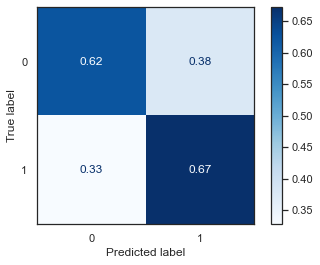

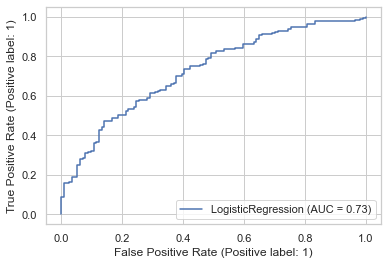

              precision    recall  f1-score   support

           0       0.56      0.62      0.59       114
           1       0.73      0.67      0.70       171

    accuracy                           0.65       285
   macro avg       0.64      0.65      0.64       285
weighted avg       0.66      0.65      0.66       285



In [29]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = []

parameters = {
    "C": [0.1, 1, 10, 100],
    "max_iter": [1000, 5000, 10000]
  }

best_config = None
best_score = 0

sm = SMOTE(random_state=42)

for config in ParameterGrid(parameters):
    scores = []
    for train_index, test_index in kf.split(X_train_val, y_train_val):
        X_train, X_val = X_train_val[train_index], X_train_val[test_index]
        y_train, y_val = y_train_val[train_index], y_train_val[test_index]
    
        #SMOTE
        X_res, y_res = sm.fit_resample(X_train, y_train)
        #X_res, y_res = X_train, y_train
    
        #Classification
        clf = LogisticRegression(**config, random_state=42)
        clf.fit(X_res, y_res)
        pred = clf.predict(X_val)
        scores.append(accuracy_score(y_val, pred))
    
    if np.mean(scores)>best_score:
        best_score = np.mean(scores)
        best_config = config
    print(f"{config}: mean accuracy score {np.mean(scores):.3f}")

X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
#X_res, y_res = X_train_val, y_train_val
clf = LogisticRegression(**best_config, random_state=42)
clf.fit(X_res, y_res)
pred = clf.predict(X_test)
print(f"\nbest config: {best_config}\naccuracy score: {accuracy_score(y_test, pred):.3f}")
sns.set(style="white")
plot_confusion_matrix(clf, X_test, y_test, normalize='true', cmap='Blues')
sns.set(style="whitegrid")
plot_roc_curve(clf, X_test, y_test)
plt.show()
print(classification_report(y_test, pred))

In [ ]:
importance = clf.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
    print(f'Feature: {df.columns[i]}, Score: {v:.5f}')
# plot feature importance
plt.figure(figsize=(13,4))
plt.bar([df.columns[x] for x in range(len(importance))], importance, color='slategray')
plt.show()

## SVM

{'C': 0.01, 'kernel': 'linear'}: mean accuracy score 0.643
{'C': 0.01, 'kernel': 'rbf'}: mean accuracy score 0.672
{'C': 0.1, 'kernel': 'linear'}: mean accuracy score 0.675
{'C': 0.1, 'kernel': 'rbf'}: mean accuracy score 0.684
{'C': 1, 'kernel': 'linear'}: mean accuracy score 0.695
{'C': 1, 'kernel': 'rbf'}: mean accuracy score 0.673
{'C': 10, 'kernel': 'linear'}: mean accuracy score 0.696
{'C': 10, 'kernel': 'rbf'}: mean accuracy score 0.666
{'C': 50, 'kernel': 'linear'}: mean accuracy score 0.696
{'C': 50, 'kernel': 'rbf'}: mean accuracy score 0.647
{'C': 100, 'kernel': 'linear'}: mean accuracy score 0.695
{'C': 100, 'kernel': 'rbf'}: mean accuracy score 0.632

best config: {'C': 10, 'kernel': 'linear'}
accuracy score: 0.660


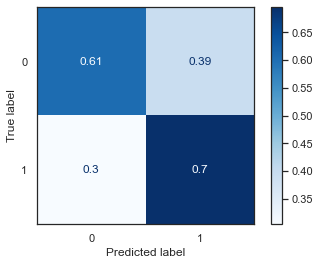

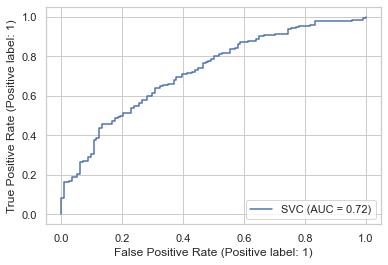

              precision    recall  f1-score   support

           0       0.57      0.61      0.59       114
           1       0.73      0.70      0.71       171

    accuracy                           0.66       285
   macro avg       0.65      0.65      0.65       285
weighted avg       0.66      0.66      0.66       285



In [30]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = []

parameters = {
  "C": [0.01, 0.1, 1, 10, 50, 100],
  "kernel": ["linear", "rbf"]
  }

best_config = None
best_score = 0

sm = SMOTE(random_state=42)

for config in ParameterGrid(parameters):
    scores = []
    for train_index, test_index in kf.split(X_train_val, y_train_val):
        X_train, X_val = X_train_val[train_index], X_train_val[test_index]
        y_train, y_val = y_train_val[train_index], y_train_val[test_index]
    
        #SMOTE
        X_res, y_res = sm.fit_resample(X_train, y_train)
        #X_res, y_res = X_train, y_train
    
        #Classification
        clf = SVC(**config, random_state=42)
        clf.fit(X_res, y_res)
        pred = clf.predict(X_val)
        scores.append(accuracy_score(y_val, pred))
    
    if np.mean(scores)>best_score:
        best_score = np.mean(scores)
        best_config = config
    print(f"{config}: mean accuracy score {np.mean(scores):.3f}")

X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
#X_res, y_res = X_train_val, y_train_val
clf = SVC(**best_config, random_state=42)
clf.fit(X_res, y_res)
pred = clf.predict(X_test)
print(f"\nbest config: {best_config}\naccuracy score: {accuracy_score(y_test, pred):.3f}")
sns.set(style="white")
plot_confusion_matrix(clf, X_test, y_test, normalize='true', cmap='Blues')
sns.set(style="whitegrid")
plot_roc_curve(clf, X_test, y_test)
plt.show()
print(classification_report(y_test, pred))

## LDA


accuracy score: 0.674


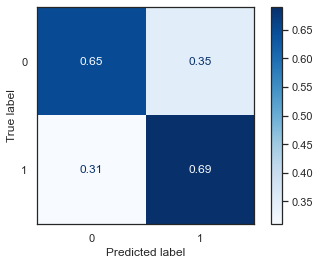

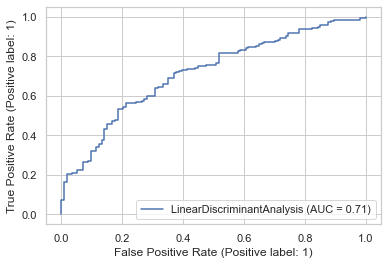

              precision    recall  f1-score   support

           0       0.58      0.65      0.61       114
           1       0.75      0.69      0.72       171

    accuracy                           0.67       285
   macro avg       0.66      0.67      0.67       285
weighted avg       0.68      0.67      0.68       285



In [17]:
sm = SMOTE(random_state=42)

X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
#X_res, y_res = X_train_val, y_train_val
clf = LinearDiscriminantAnalysis()
clf.fit(X_res, y_res)

pred = clf.predict(X_test)
print(f"\naccuracy score: {accuracy_score(y_test, pred):.3f}")
sns.set(style="white")
plot_confusion_matrix(clf, X_test, y_test, normalize='true', cmap='Blues')
sns.set(style="whitegrid")
plot_roc_curve(clf, X_test, y_test)
plt.show()
print(classification_report(y_test, pred))
#print(clf.explained_variance_ratio_)

In [18]:
lda = LinearDiscriminantAnalysis()
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train_val, y_train_val)
X_lda_train_val = lda.fit(X_res, y_res).transform(X_train_val)
X_lda_test = lda.transform(X_test)

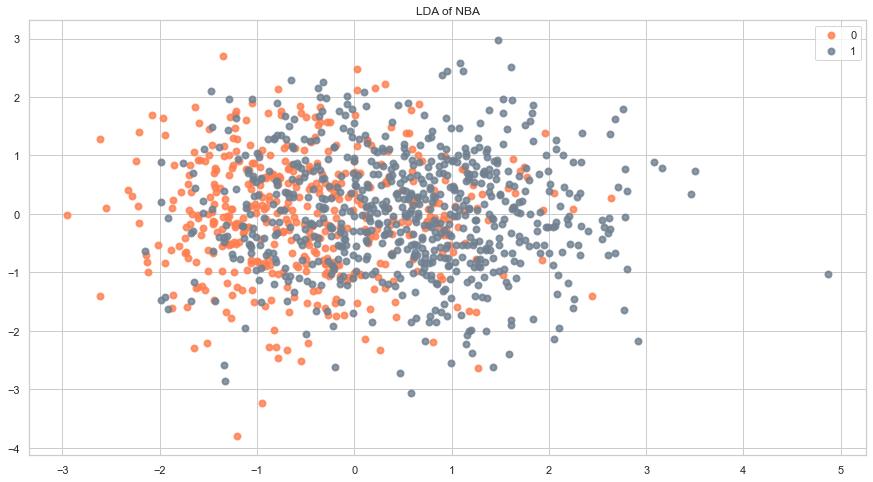

In [19]:
plt.figure(figsize=(15,8))
colors = ['coral', 'slategray']
target_names=['0', '1']
lw = 2

for color, i, target_name in zip(colors, [0, 1], target_names):
    plt.scatter(X_lda_train_val[y_train_val == i, 0], np.random.normal(size=len(X_lda_train_val[y_train_val == i, 0])), color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('LDA of NBA')
plt.show()